# Automatic segmentation of face masks with Convolutional Neural Networks

The aim of this project was to develop a Convolutional Neural Network (CNN) for the automatic segmentation of Covid-19 face masks.\
The dataset used for the training of the model is freely available on [Kaggle](https://www.kaggle.com/datasets/perke986/face-mask-segmentation-dataset). \
The dataset contains 222 images with different resolution, with the corresponding manually segmented ground truths (GT). A GT is an image in which the pixels associated with the background assume the value 0 (black pixel), while the pixels associated with the object we want to segment assume the value 1 (white pixel). To train and validate the model, the original dataset was splitted in three mutually exclusive sets: the training set containing 80% of the data, the validation set containing 10% of the data, and a final test set containing the remaining 10%. The procedure used for the train-test split can be found in the *train_test_split.py* file.

### Image patches

Since the original images had variable dimension in widht (w) and height (h), I decided to extract patches of dimension 256x256 pixels. Before the patch extraction, the original images were downscaled by a factor two. This was done for two reasons:
* The images had high resolution, but the portions of the images including face masks were usually small, so we don't really need all those pixels and we can reduce the dimension to speed up the prediction.
* In a few number of images, face masks covered a big part of the image, so, some of the resulting patches had only face masks pixels in them, with a resulting GT assuming the value 1 everywhere. This isn't actually useful for the training because the network has no context to understand that the patch only contains mask pixels. To deal with this problem, in the cases in which the mask covered most of the image, a further downscale was performed. In this way no more completely white GT were produced.

Finally, only the GT patches containing at least the 1% of white pixels were retained.\
The code to generate the image patches, with associated GTs, can be found in the *patch_generator.py* file.

Now let's take a look to the main code.

### Import the libraries
First of all we import all the required libraries. Here **Utils** contains some codes I wrote for image segmentation purposes. *Utils.models* can be used to build a Unet-like segmentation model with different possible backbones (i.e., encoders). *Utils.metrics* contains the functions to calculate two common metrics in tensorflow: the *f1 score* and the *iou score* 

In [1]:
import os
import numpy as np
import pylab as plt
from itertools import islice
from operator import itemgetter
import cv2

import tensorflow as tf
from mpl_toolkits.axes_grid1 import make_axes_locatable

from Utils.models import Unet
from Utils.metrics import f1_score, iou_score
import matplotlib.patches as mpatches
import seaborn as sns

import time

BATCH = 6
IMG_SIZE = 256

### Data augmentation

Since we have few images available, an image data generator was used to perform data augmentation. The transformations applied to perform data augmetation are *horizontal flip* and *vertical flip*.
Here the function *get_mask* simply applied a gaussian blur and a following threshold at 127. This was done because the interpolation used for the downscaling of the GTs produced coarse results, but with the application of the gaussian filter the GTs become smoother. 

In [4]:
def get_mask (img : np.ndarray) -> np.ndarray:
    img.astype('uint8')
    blur = cv2.GaussianBlur(img, (5, 5), 0)
    _, thr = cv2.threshold(blur, 127, 255, cv2.THRESH_BINARY)
    thr = np.expand_dims(thr, axis=-1)
    thr = thr.astype('float32') * (1./255)
    return thr

augmentation_params = {
    "rotation_range": 0,
    "width_shift_range": 0.0,
    "height_shift_range": 0.0,
    "shear_range": 0.0,
    "zoom_range": 0.0,
    "horizontal_flip": True,
    "vertical_flip": True,
    "fill_mode": "constant",
    "cval": 0.0,
    "validation_split": 0.1,
}

train_params = {
    "target_size": (IMG_SIZE, IMG_SIZE),
    "class_mode": "input",
    "batch_size": BATCH,
    "shuffle": True,
    "seed": 42,
    "save_to_dir": None,
    "save_prefix": "",
    "save_format": "png",
}

image_augmentation = tf.keras.preprocessing.image.ImageDataGenerator(
    **augmentation_params, rescale=1.0 / 255
)
masks_augmentation = tf.keras.preprocessing.image.ImageDataGenerator(
    **augmentation_params, preprocessing_function=get_mask
)

train_image_generator = image_augmentation.flow_from_directory(
    directory="./data/Train/images/",
    **train_params,
    color_mode="rgb",
    classes=["patches"],
    subset="training"
)
train_masks_generator = masks_augmentation.flow_from_directory(
    directory="./data/Train/masks",
    **train_params,
    color_mode="grayscale",
    classes=["patches"],
    subset="training"
)

val_image_generator = image_augmentation.flow_from_directory(
    directory="./data/Train/images",
    **train_params,
    color_mode="rgb",
    classes=["patches"],
    subset="validation"
)
val_masks_generator = masks_augmentation.flow_from_directory(
    directory="./data/Train/masks",
    **train_params,
    color_mode="grayscale",
    classes=["patches"],
    subset="validation"
)

train_generator = zip(
    map(itemgetter(0), (train_image_generator)),
    map(itemgetter(0), (train_masks_generator)),
)
validation_generator = zip(
    map(itemgetter(0), (val_image_generator)), map(itemgetter(0), (val_masks_generator)))

Found 295 images belonging to 1 classes.
Found 295 images belonging to 1 classes.
Found 32 images belonging to 1 classes.
Found 32 images belonging to 1 classes.


Let's visualize some of the training samples

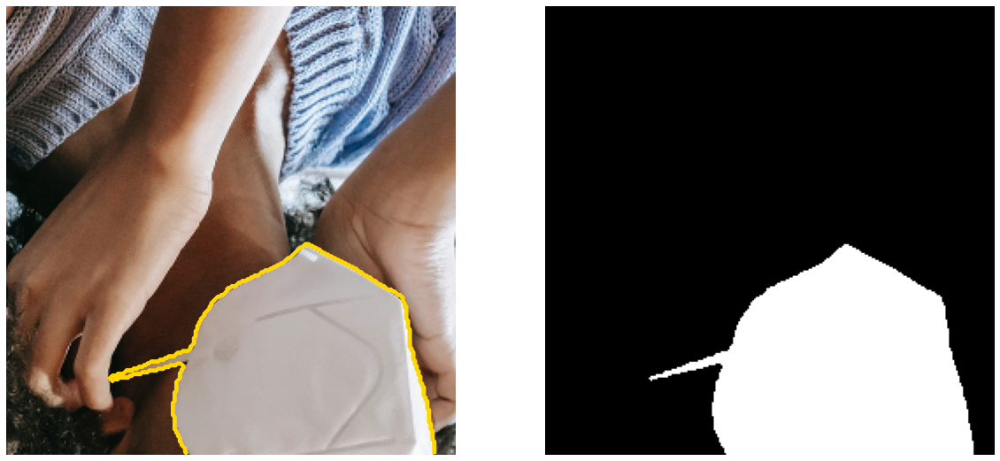

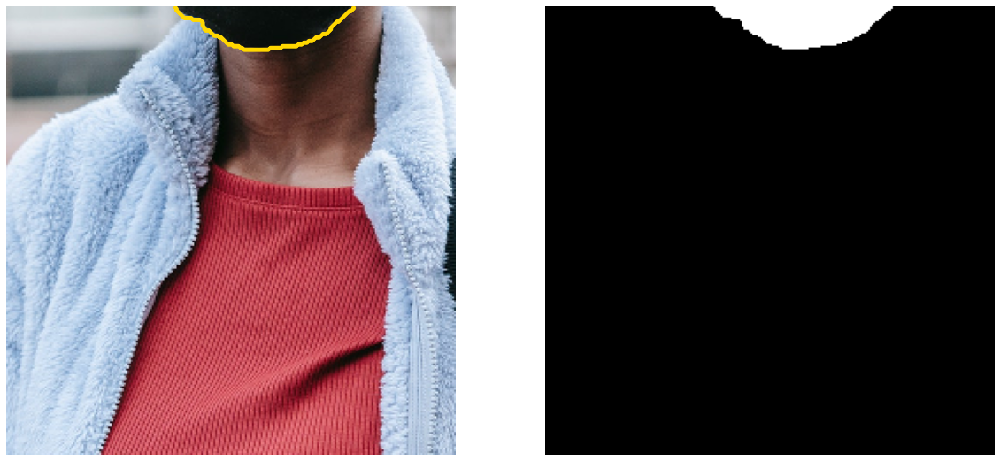

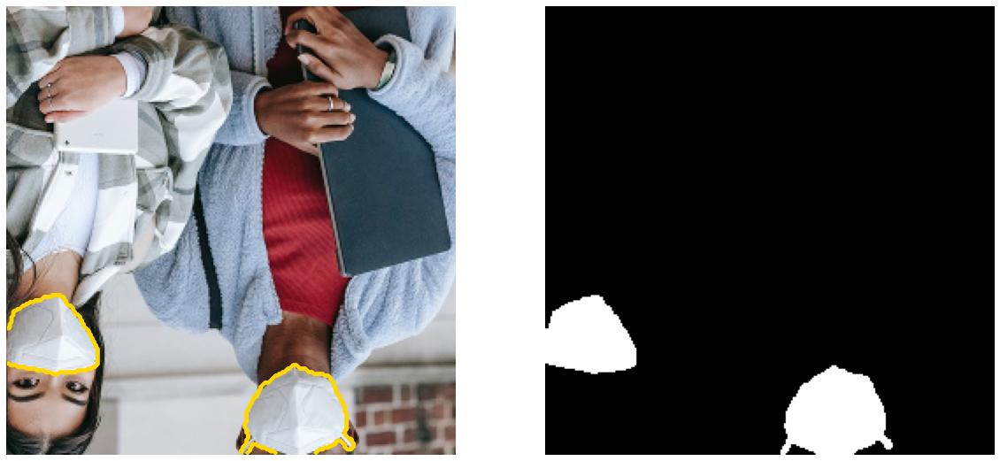

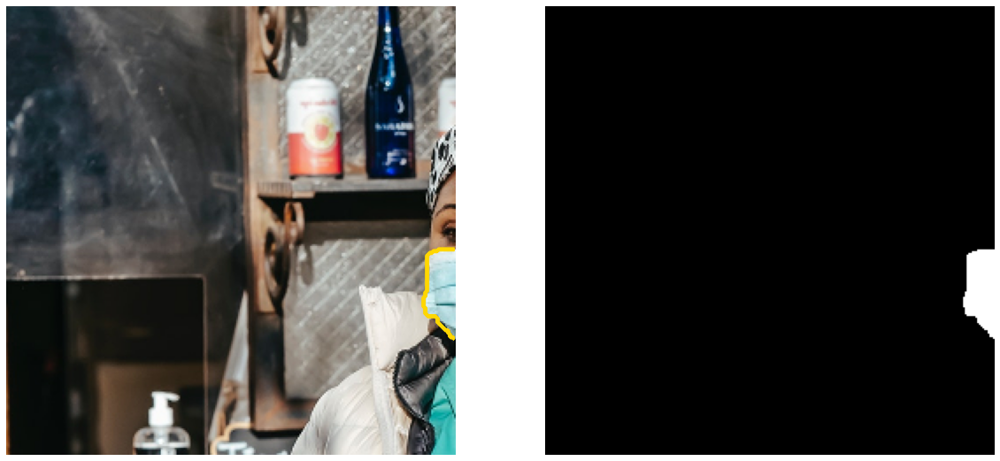

In [128]:
for img, mask in islice(train_generator, 4):
    
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20, 10))
    ax1.imshow(img[0, ...]); ax1.axis('off')
    ax1.contour(mask[0, ..., 0], colors='gold', linewidths=3)
    ax2.imshow(mask[0, ..., 0], cmap='gray', vmin=0, vmax=1); ax2.axis('off')
    

### The loss function

Here we use a combination of two common metrics as the total loss function: the **IoU score** and the **F1 score**. Both these metrics assume values between 0 and 1, with 1 being perfection. Since we need to minimize the Loss value, we use as loss contributes 1 - Iou score and 1 - F1 score

In [129]:
def loss (y_true, y_pred):

    dice = 1 - f1_score(y_true, y_pred)
    jaccard = 1 - iou_score(y_true, y_pred)

    return dice + jaccard

### The model

The model used is a [Unet](https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/)-like CNN with a [ResNet50](https://arxiv.org/abs/1512.03385) backbone. The optimizer used is Adam, with an initial learning rate of $10^{-4}$. The model is trained for 50 epochs, with early stopping after 15 epochs if the validation loss does not improve. The *ReduceLROnPlateau* callback is used to reduce the learning rate after 10 epochs of no improvement. Finally, the weights of the model achieving the best validation score are saved to disk.

In [130]:
model = Unet(input_shape=(256, 256, 3), backbone='resnet50', classes=1)

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
              loss=loss,
              metrics=[f1_score, iou_score])

In [ ]:
# fit model
history = model.fit(x=train_generator, y=None,
                    batch_size=BATCH,
                    epochs=50,
                    steps_per_epoch=train_image_generator.n // BATCH,
                    callbacks=[
                                tf.keras.callbacks.ModelCheckpoint('best_model.h5', 
                                                                   save_weights_only=True, 
                                                                   save_best_only=True, 
                                                                   mode='min'),
                                tf.keras.callbacks.ReduceLROnPlateau(),
                                tf.keras.callbacks.EarlyStopping(monitor='val_loss', 
                                                                 min_delta=1e-4, patience=15, 
                                                                 verbose=True,
                                                                 mode='auto', baseline=None, 
                                                                 restore_best_weights=True),
                              ],
                    validation_data=validation_generator,
                    validation_steps=val_image_generator.n // BATCH,
                    initial_epoch=0,
                    validation_freq=1,
                    max_queue_size=10, 
                    workers=1, 
                    use_multiprocessing=False,
                    shuffle=True,
                    verbose=1
                   )

### Training results

Let's display the training results. As we can see, after roughly 20 epochs, the value of the validation loss gets close to the value o the training loss, showing that the model is performing well. At the end of the training, the validation F1-score is around 0.9, while the validation IoU score is around 0.85. The maximum values achieved for F1 score and IoU score are 0.925 and 0.861 respectively. These values are quite high and show that the model has good generalization capabilities.

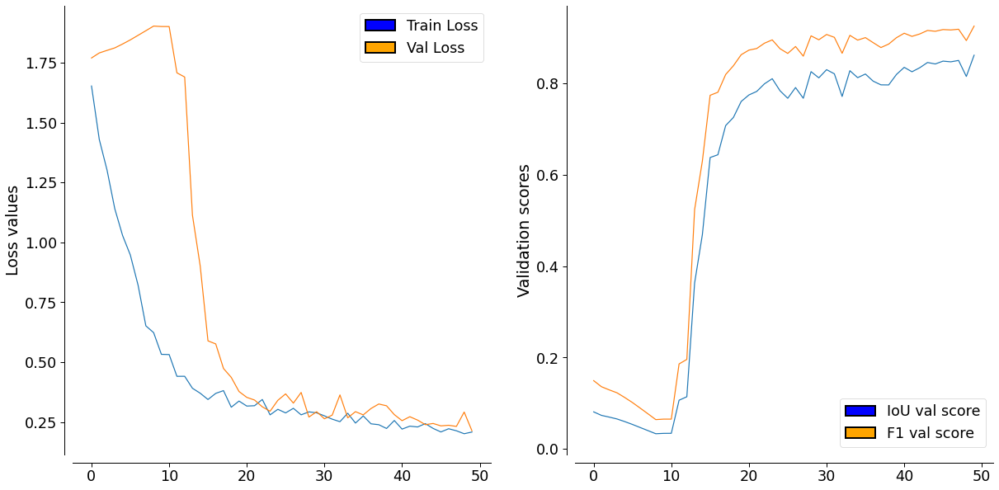

In [166]:
fig1_lbl = [ mpatches.Patch(facecolor='blue', label='Train Loss', edgecolor='k', linewidth=2),
             mpatches.Patch(facecolor='orange', label='Val Loss', edgecolor='k', linewidth=2)
           ]

fig2_lbl = [ mpatches.Patch(facecolor='blue', label='IoU val score', edgecolor='k', linewidth=2),
             mpatches.Patch(facecolor='orange', label='F1 val score', edgecolor='k', linewidth=2)
           ]

epochs = np.arange(len(history.history['loss']))

with sns.plotting_context('paper', font_scale=2):
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20, 10))
    loss = sns.lineplot(x=epochs, y=history.history['loss'],
                        markers=True, dashes=False, 
                        ax=ax1)
    val_loss = sns.lineplot(x=epochs, y=history.history['val_loss'],
                            markers=True, dashes=False, 
                            ax=ax1)
    ax1.set_ylabel('Loss values')
    sns.despine(ax=ax1, offset=10, top=True, right=True, bottom=False, left=False)
    #ax1.set_yscale('log')
    ax1.legend(handles=fig1_lbl, loc='upper right')
    
    
    loss = sns.lineplot(x=epochs, y=history.history['val_iou_score'],
                        markers=True, dashes=False, 
                        ax=ax2)
    val_loss = sns.lineplot(x=epochs, y=history.history['val_f1_score'],
                            markers=True, dashes=False, 
                            ax=ax2)
    ax2.set_ylabel('Validation scores')
    sns.despine(ax=ax2, offset=10, top=True, right=True, bottom=False, left=False)
    #ax2.set_yscale('log')
    ax2.legend(handles=fig2_lbl, loc='lower right')

Let's visualize the model predictions on the validation patches

1/1 [==============================] - 0s 20ms/step


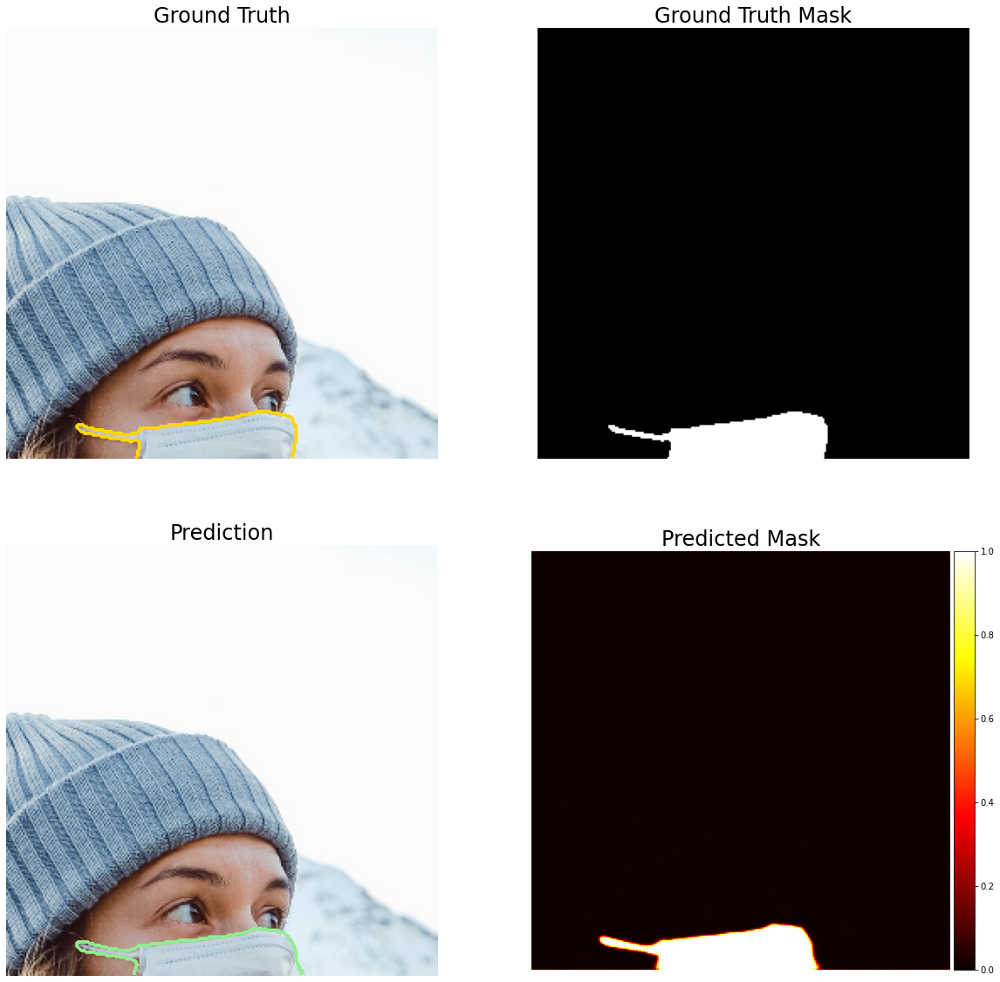

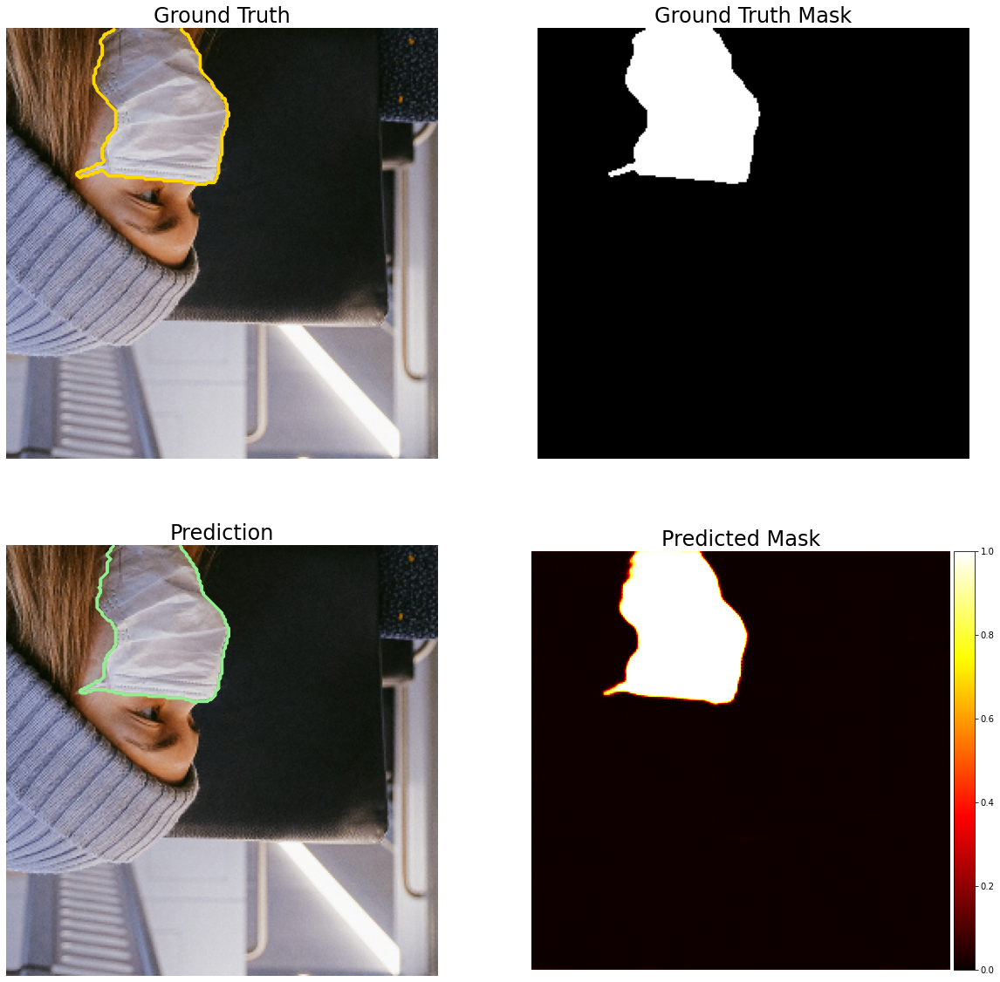

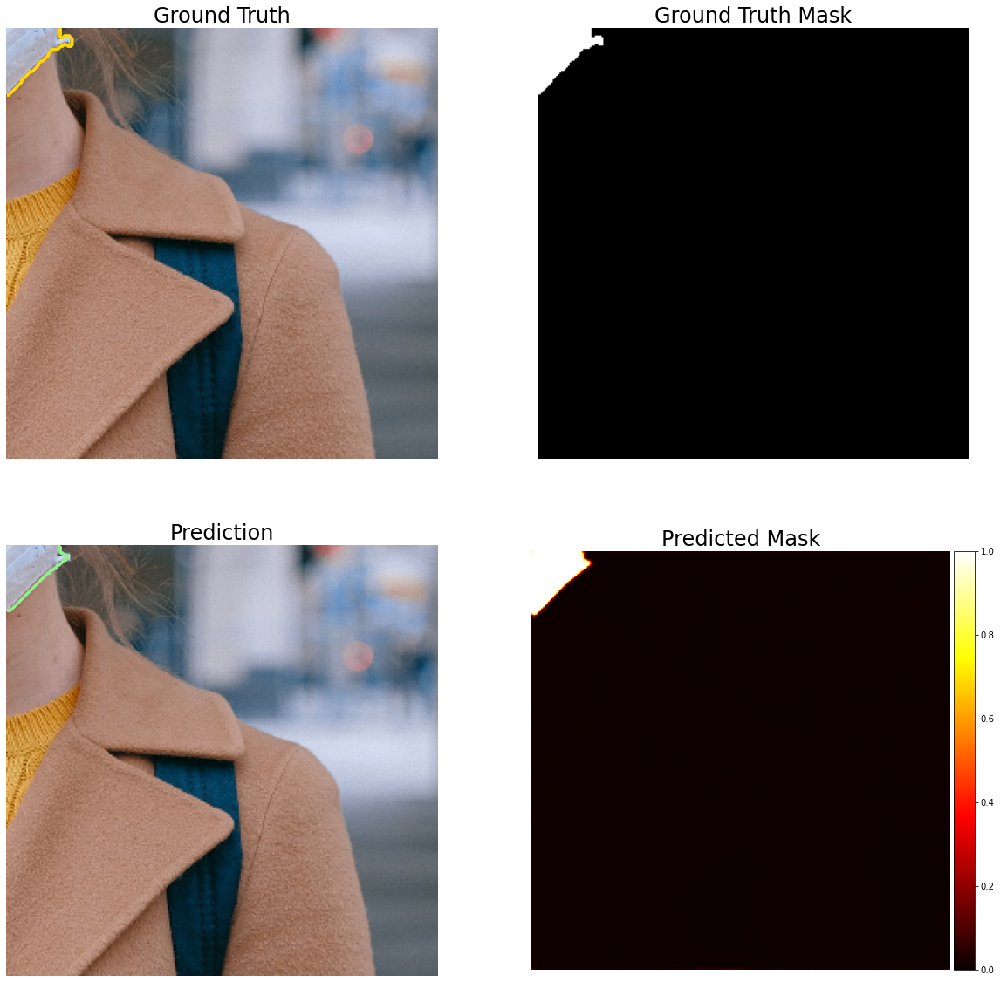

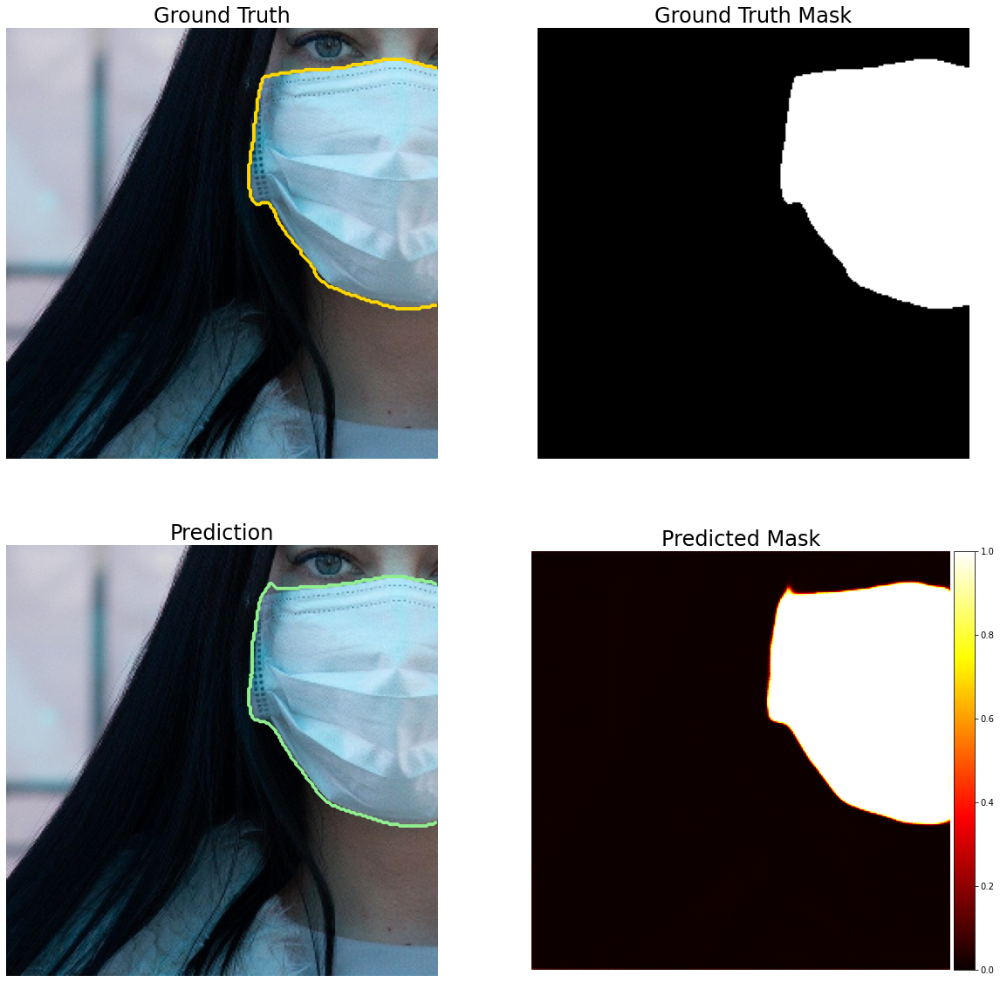

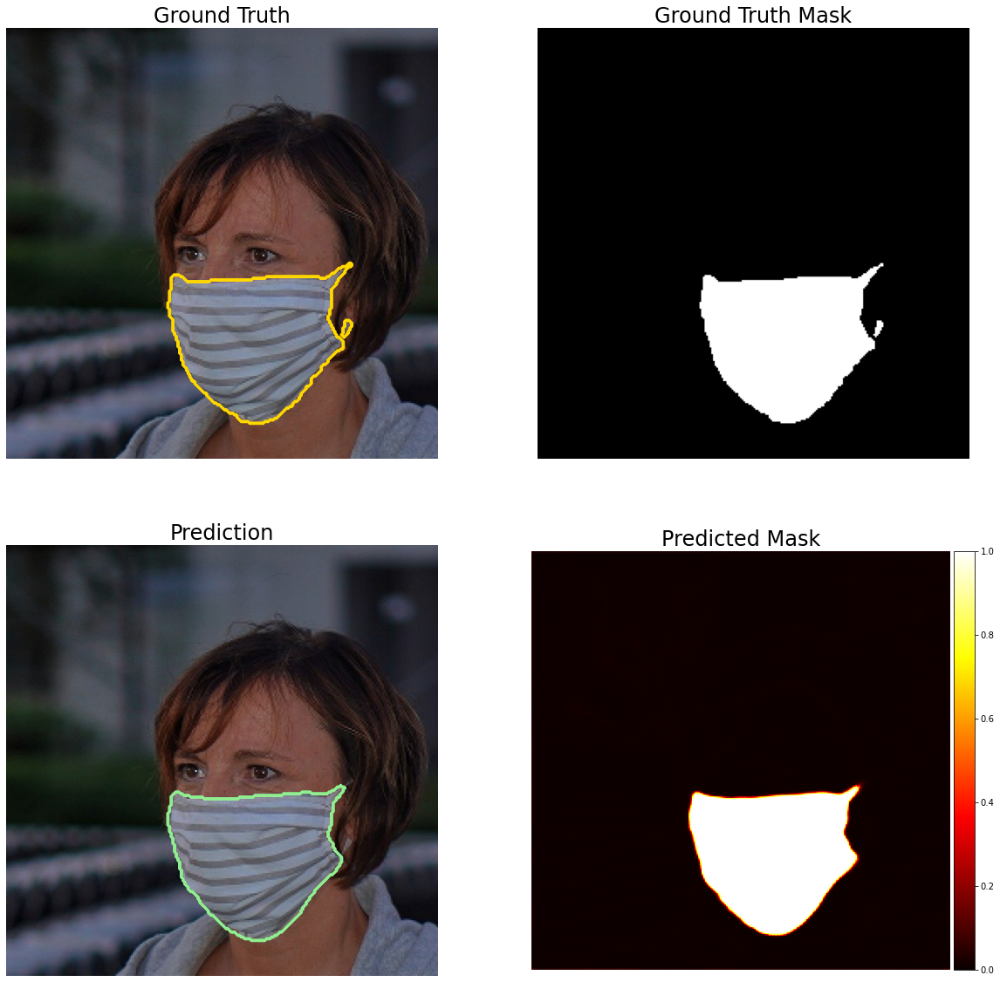

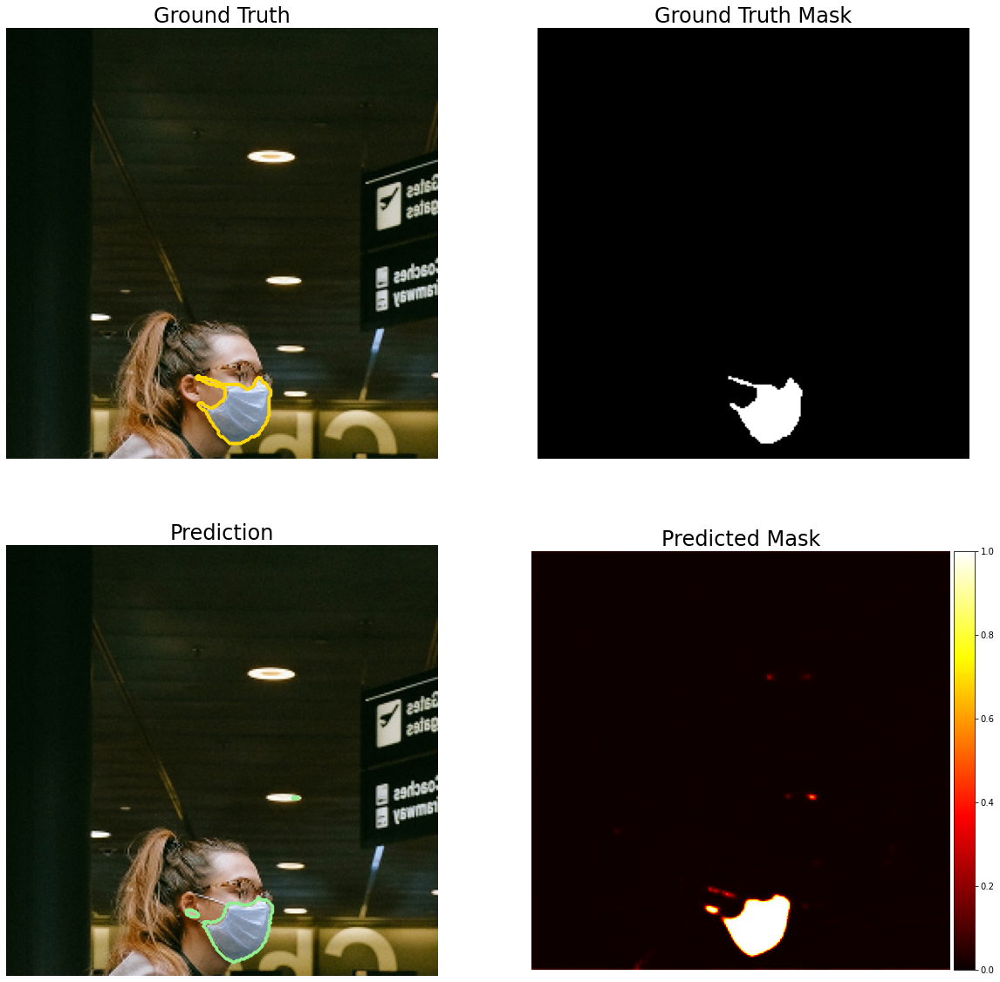

In [6]:
X_test, y_test = zip(*[next(validation_generator) for _ in range(1)])
X_test, y_test = X_test[0], y_test[0]

mask_pred = model.predict(tf.convert_to_tensor(X_test))

for img, gt_mask, pr_mask in zip(X_test, y_test, mask_pred):
    
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(nrows=2, ncols=2, figsize=(20, 20))
        
    ax1.axis('off'); ax2.axis('off'); ax3.axis('off'); ax4.axis('off');
    
    ax1.imshow(img)
    ax1.contour(gt_mask[..., 0], colors='gold', linewidths=2)

    ax2.imshow(gt_mask[..., 0], cmap='gray', vmin=0, vmax=1)

    ax3.imshow(img)
    ax3.contour(pr_mask[..., 0] > 0.5, colors='lightgreen', linewidths=2)

    im = ax4.imshow(pr_mask[..., 0], cmap='hot', vmin=0, vmax=1)
    
    divider = make_axes_locatable(ax4)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im, cax=cax, orientation='vertical', shrink=0.6)
    
    ax1.set_title('Ground Truth', fontsize=24)
    ax2.set_title('Ground Truth Mask', fontsize=24)
    ax3.set_title('Prediction', fontsize=24)
    ax4.set_title('Predicted Mask', fontsize=24)

It seems that the model does a reasonably good job!

### Prediction of the test images

To predict arbitrarily large images, I wrote the function *predict_patches*. It takes the source path as input, opens the images, downsizes it by a factor two, extracts the corresponding patches, predicts the patches one by one, and then puts them back togheter to give in output the image with the corresponding prediction. The function also takes in input the model to use for prediction and other two arguments: the *patch size* and the *stride*. The first argument is used to set the dimension of the patches, the second controls the stride of the sliding window. With stride equal or greater than the patch size all the patches are mutually exclusive, while a stride lower than the patch size produces overlapping patches. The prediction on overlapping regions is the average over the predicted patches, so, generating overlapping patches helps in producing smoother predictions. The drawback of using a small stride is that the number of patches produced increases, making the prediction slower.

In [134]:
def predict_patches(filename, model, patch_size=256, stride=256):

    start = time.time()
    img = cv2.imread(filename)
    img = cv2.resize(img, dsize=None, fx=0.5, fy=0.5, interpolation=cv2.INTER_CUBIC)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img[
        : patch_size * (img.shape[0] // patch_size), : patch_size * (img.shape[1] // patch_size)
    ]
    img = np.expand_dims(img, axis=0)

    patches = tf.image.extract_patches(
        img,
        sizes=(1, patch_size, patch_size, 1),
        strides=(1, stride, stride, 1),
        padding="VALID",
        rates=(1, 1, 1, 1),
    )

    patches = tf.reshape(
        patches,
        shape=(
            patches.shape[0],
            patches.shape[1],
            patches.shape[2],
            patch_size,
            patch_size,
            3,
        ),
    )
    patches = tf.cast(patches, dtype=tf.float32)
    batches = tf.reshape(patches, shape=(-1, patch_size, patch_size, 3))
    batches *= 1.0 / 255

    predictions = model.predict(batches)
    predictions = tf.reshape(predictions, shape=(*patches.shape[:-1], 1))

    reconstruction = np.zeros(shape=(*img.shape[:-1], 1))
    mask = np.zeros(shape=(*img.shape[:-1], 1))

    for i in range(patches.shape[1]):
        for j in range(patches.shape[2]):

            reconstruction[
                0,
                i * stride : (i * stride + patch_size),
                j * stride : (j * stride + patch_size),
            ] += predictions[0, i, j].numpy()
            mask[
                0,
                i * stride : (i * stride + patch_size),
                j * stride : (j * stride + patch_size),
            ] += 1

    reconstruction = reconstruction / mask
    reconstruction = np.squeeze(reconstruction)
    img = np.squeeze(img)
    end = time.time()
    print(f"prediction lasted: {end - start} seconds")

    return img, reconstruction

In [136]:
PATH_IMG = './data/Test/images/'
PATH_MASK = './data/Test/masks/'

test_images = os.listdir(PATH_IMG)
test_masks = os.listdir(PATH_MASK)

Let's visualize the prediction on the test images. These are images that the model have never seen. On average, with stride=32, the prediction of the full image take roughly 1 second.

5/5 [==============================] - 1s 122ms/step
prediction lasted: 1.1262459754943848 seconds
5/5 [==============================] - 1s 119ms/step
prediction lasted: 1.1205573081970215 seconds
5/5 [==============================] - 1s 119ms/step
prediction lasted: 1.1461338996887207 seconds
5/5 [==============================] - 1s 118ms/step
prediction lasted: 1.1035168170928955 seconds
5/5 [==============================] - 1s 119ms/step
prediction lasted: 1.1102848052978516 seconds
5/5 [==============================] - 1s 119ms/step
prediction lasted: 1.1166841983795166 seconds
5/5 [==============================] - 1s 120ms/step
prediction lasted: 1.129812240600586 seconds
5/5 [==============================] - 1s 119ms/step
prediction lasted: 1.112077236175537 seconds
5/5 [==============================] - 1s 120ms/step
prediction lasted: 1.1367218494415283 seconds
5/5 [==============================] - 1s 119ms/step
prediction lasted: 1.7370331287384033 seconds
5/5 [=======

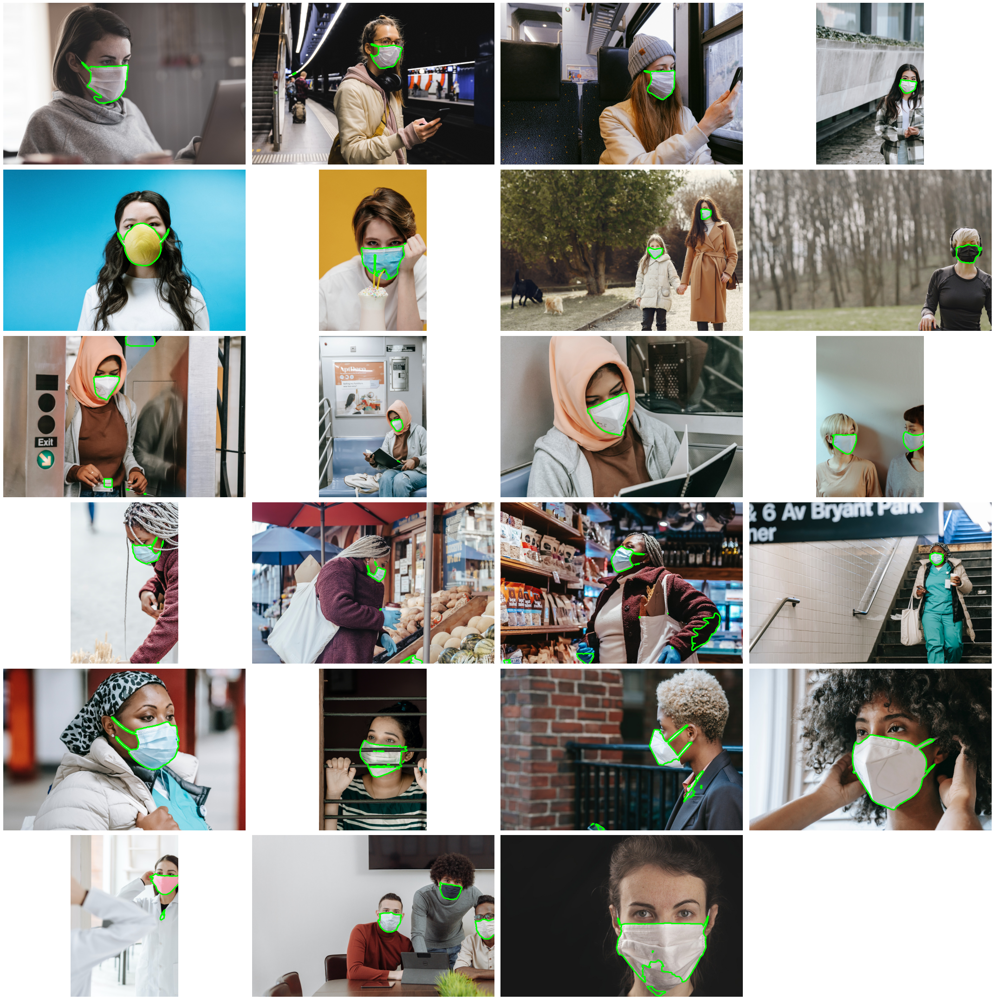

In [159]:
fig = plt.figure(figsize=(30, 30), tight_layout=True)
n_cols = 4
n_rows = 6

for i, im in enumerate(test_images):

    img = os.path.join(PATH_IMG, im)
    img, mask = predict_patches(img, model=model, patch_size=256, stride=32)
    ax = fig.add_subplot(6, 4, i+1)
    ax.imshow(img)
    ax.axis('off')
    ax.contour((mask>0.5).astype('uint8'), colors='lime', linewidths=2)


As we can see, the result is quite impressive! In most of the images the prediction is flawless. There are a couple of images with minor imperfection, and a couple in which the model did not perform well. However, considering that the task of semantic segmentation is more complex than an object detection, and that the dataset used in the work was quite small and heterogeneous, the final result is very good. 